In [2]:
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import numpy as np
import re

In [3]:
# Create function to find null values
def find_null_values(df):
    for column in df.columns:
        if df[column].isnull().sum() > 0:
            print(f'Column {column} has {df[column].isnull().sum()} null values')

In [4]:
# Create function to remove state abbreviation after city name
def remove_state_abbv(df):
    df['RegionName'] = [re.sub("(.*),.*", "\\1", str(x)) for x in df['RegionName']]

In [5]:
## Home Value Index Data


In [7]:
file_path2 = '../Resources/Zillow_HVI.csv'
hvi_df = pd.read_csv(file_path2, skiprows=[1])
hvi_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,"New York, NY",Msa,NY,225516.0,226863.0,228076.0,230462.0,232684.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,231193.0,231998.0,233231.0,235575.0,238089.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,394463,3,"Chicago, IL",Msa,IL,171271.0,171675.0,172198.0,173245.0,174354.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,131555.0,131660.0,131748.0,131961.0,132186.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,394974,5,"Philadelphia, PA",Msa,PA,130664.0,131102.0,131365.0,132019.0,132548.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0


In [8]:
# Remove state abbreviation after city name
remove_state_abbv(hvi_df)
hvi_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,225516.0,226863.0,228076.0,230462.0,232684.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,231193.0,231998.0,233231.0,235575.0,238089.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,394463,3,Chicago,Msa,IL,171271.0,171675.0,172198.0,173245.0,174354.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,394514,4,Dallas-Fort Worth,Msa,TX,131555.0,131660.0,131748.0,131961.0,132186.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,394974,5,Philadelphia,Msa,PA,130664.0,131102.0,131365.0,132019.0,132548.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0


In [9]:
# Get column dates from last two years only
hvi_new = hvi_df[hvi_df.columns[np.concatenate([range(0,5),range(222,275)])]]
hvi_new

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,460564.0,463521.0,466559.0,468942.0,470602.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,645528.0,650554.0,655102.0,657653.0,660519.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,394463,3,Chicago,Msa,IL,235641.0,236447.0,236934.0,237390.0,237826.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,394514,4,Dallas-Fort Worth,Msa,TX,239537.0,241512.0,243066.0,244240.0,245376.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,394974,5,Philadelphia,Msa,PA,235521.0,236999.0,238512.0,239499.0,240009.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902,394767,929,Lamesa,Msa,TX,69369.0,69990.0,70391.0,70759.0,71034.0,...,90901.0,91860.0,92441.0,94055.0,95700.0,97936.0,99128.0,100176.0,101259.0,102796.0
903,753874,930,Craig,Msa,CO,208440.0,208619.0,208181.0,207425.0,205875.0,...,240977.0,243967.0,245587.0,249005.0,251980.0,254360.0,254611.0,254762.0,255699.0,259578.0
904,394968,931,Pecos,Msa,TX,NaN,NaN,NaN,NaN,NaN,...,165382.0,170185.0,171244.0,174065.0,176831.0,179332.0,181149.0,183894.0,186876.0,190000.0
905,395188,932,Vernon,Msa,TX,70489.0,70826.0,71041.0,71194.0,71379.0,...,79200.0,79551.0,79838.0,81980.0,84202.0,86827.0,87516.0,88168.0,88454.0,89621.0


In [10]:
# Drop columns to clean up dataframe
hvi_data = hvi_new.drop(columns=['RegionID','RegionType']).reset_index(drop=True)
hvi_data.head()

,SizeRank,RegionName,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,1,New York,NY,460564.0,463521.0,466559.0,468942.0,470602.0,471314.0,472019.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,2,Los Angeles-Long Beach-Anaheim,CA,645528.0,650554.0,655102.0,657653.0,660519.0,660951.0,661828.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,3,Chicago,IL,235641.0,236447.0,236934.0,237390.0,237826.0,238240.0,238541.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,4,Dallas-Fort Worth,TX,239537.0,241512.0,243066.0,244240.0,245376.0,246368.0,247592.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,5,Philadelphia,PA,235521.0,236999.0,238512.0,239499.0,240009.0,240483.0,241019.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0


In [11]:
hvi_data = hvi_data.dropna().reset_index(drop=True)
hvi_data.head()

,SizeRank,RegionName,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,1,New York,NY,460564.0,463521.0,466559.0,468942.0,470602.0,471314.0,472019.0,...,567599.0,572173.0,575746.0,579000.0,582977.0,587634.0,594089.0,601248.0,608793.0,614826.0
1,2,Los Angeles-Long Beach-Anaheim,CA,645528.0,650554.0,655102.0,657653.0,660519.0,660951.0,661828.0,...,846547.0,851306.0,858511.0,867810.0,878593.0,890931.0,908424.0,927686.0,944296.0,945642.0
2,3,Chicago,IL,235641.0,236447.0,236934.0,237390.0,237826.0,238240.0,238541.0,...,285566.0,288245.0,290960.0,293700.0,296355.0,298940.0,302259.0,305752.0,309745.0,312752.0
3,4,Dallas-Fort Worth,TX,239537.0,241512.0,243066.0,244240.0,245376.0,246368.0,247592.0,...,329869.0,336001.0,341515.0,347444.0,354921.0,363495.0,371655.0,381221.0,389992.0,397605.0
4,5,Philadelphia,PA,235521.0,236999.0,238512.0,239499.0,240009.0,240483.0,241019.0,...,309169.0,311638.0,314135.0,316430.0,318994.0,321556.0,324826.0,328526.0,332874.0,336380.0


In [12]:
# add date column labels to list to use in fixing rent dataframe column labels
labels = (hvi_data.columns[3:].values.tolist())
print(labels)

['2018-02-28', '2018-03-31', '2018-04-30', '2018-05-31', '2018-06-30', '2018-07-31', '2018-08-31', '2018-09-30', '2018-10-31', '2018-11-30', '2018-12-31', '2019-01-31', '2019-02-28', '2019-03-31', '2019-04-30', '2019-05-31', '2019-06-30', '2019-07-31', '2019-08-31', '2019-09-30', '2019-10-31', '2019-11-30', '2019-12-31', '2020-01-31', '2020-02-29', '2020-03-31', '2020-04-30', '2020-05-31', '2020-06-30', '2020-07-31', '2020-08-31', '2020-09-30', '2020-10-31', '2020-11-30', '2020-12-31', '2021-01-31', '2021-02-28', '2021-03-31', '2021-04-30', '2021-05-31', '2021-06-30', '2021-07-31', '2021-08-31', '2021-09-30', '2021-10-31', '2021-11-30', '2021-12-31', '2022-01-31', '2022-02-28', '2022-03-31', '2022-04-30', '2022-05-31', '2022-06-30']


In [13]:
# Reorder data to have all the dates in one column
hvi_by_month = hvi_data.melt(id_vars=['RegionName', 'StateName', 'SizeRank'],
                                          var_name='Date',
                                          value_name='HVI')
hvi_by_month

,RegionName,StateName,SizeRank,Date,HVI
0,New York,NY,1,2018-02-28,460564.0
1,Los Angeles-Long Beach-Anaheim,CA,2,2018-02-28,645528.0
2,Chicago,IL,3,2018-02-28,235641.0
3,Dallas-Fort Worth,TX,4,2018-02-28,239537.0
4,Philadelphia,PA,5,2018-02-28,235521.0
...,...,...,...,...,...
30205,Sweetwater,TX,925,2022-06-30,94790.0
30206,Andrews,TX,926,2022-06-30,221347.0
30207,Zapata,TX,927,2022-06-30,117079.0
30208,Vermillion,SD,928,2022-06-30,231123.0


In [14]:
# Rename RegionName and StateName columns
hvi_by_month.rename(columns={'RegionName':'City', 'StateName':'State'}, inplace=True)
hvi_by_month.head()

,City,State,SizeRank,Date,HVI
0,New York,NY,1,2018-02-28,460564.0
1,Los Angeles-Long Beach-Anaheim,CA,2,2018-02-28,645528.0
2,Chicago,IL,3,2018-02-28,235641.0
3,Dallas-Fort Worth,TX,4,2018-02-28,239537.0
4,Philadelphia,PA,5,2018-02-28,235521.0


In [15]:
# Reorder DataFrames so Date column is first
hvi_by_month = hvi_by_month[['Date', 'City', 'State', 'SizeRank', 'HVI']]
hvi_by_month.head()

,Date,City,State,SizeRank,HVI
0,2018-02-28,New York,NY,1,460564.0
1,2018-02-28,Los Angeles-Long Beach-Anaheim,CA,2,645528.0
2,2018-02-28,Chicago,IL,3,235641.0
3,2018-02-28,Dallas-Fort Worth,TX,4,239537.0
4,2018-02-28,Philadelphia,PA,5,235521.0


In [16]:
# Get the monthly percentage of change for HVI for each city
hvi_by_month['%Change_HVI'] = hvi_by_month.groupby(['City', 'State'])['HVI'].pct_change().mul(100).round(2)
hvi_by_month

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Date,City,State,SizeRank,HVI,%Change_HVI
0,2018-02-28,New York,NY,1,460564.0,NaN
1,2018-02-28,Los Angeles-Long Beach-Anaheim,CA,2,645528.0,NaN
2,2018-02-28,Chicago,IL,3,235641.0,NaN
3,2018-02-28,Dallas-Fort Worth,TX,4,239537.0,NaN
4,2018-02-28,Philadelphia,PA,5,235521.0,NaN
...,...,...,...,...,...,...
30205,2022-06-30,Sweetwater,TX,925,94790.0,1.15
30206,2022-06-30,Andrews,TX,926,221347.0,1.44
30207,2022-06-30,Zapata,TX,927,117079.0,0.85
30208,2022-06-30,Vermillion,SD,928,231123.0,1.12


In [17]:
hvi_data = hvi_by_month.dropna().reset_index(drop=True)
hvi_data

,Date,City,State,SizeRank,HVI,%Change_HVI
0,2018-03-31,New York,NY,1,463521.0,0.64
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,650554.0,0.78
2,2018-03-31,Chicago,IL,3,236447.0,0.34
3,2018-03-31,Dallas-Fort Worth,TX,4,241512.0,0.82
4,2018-03-31,Philadelphia,PA,5,236999.0,0.63
...,...,...,...,...,...,...
29635,2022-06-30,Sweetwater,TX,925,94790.0,1.15
29636,2022-06-30,Andrews,TX,926,221347.0,1.44
29637,2022-06-30,Zapata,TX,927,117079.0,0.85
29638,2022-06-30,Vermillion,SD,928,231123.0,1.12


In [19]:
output_path = '../Resources/hvi_data.csv'
hvi_data.to_csv(output_path, index=False)

In [573]:
##Rent Index Data

In [20]:
file_path3 = '../Resources/Zillow_Rent_Index.csv'
rent_df = pd.read_csv(file_path3, skiprows=[1])
rent_df.head()

,RegionID,RegionName,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
0,394913,"New York, NY",1,2306.0,2335,2342.0,2348,2382,2400,2418,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,753899,"Los Angeles-Long Beach-Anaheim, CA",2,1815.0,1846,1833.0,1842,1865,1885,1903,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,394463,"Chicago, IL",3,1464.0,1477,1478.0,1483,1499,1514,1522,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,394514,"Dallas-Fort Worth, TX",4,1105.0,1130,1136.0,1152,1147,1150,1155,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,394974,"Philadelphia, PA",5,1350.0,1316,1337.0,1340,1349,1360,1365,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852


In [21]:
# Split RegionName column into City and State Columns and drop RegionName
rent_df.dropna(inplace=True)
new = rent_df['RegionName'].str.split(', ', n=1, expand=True)
rent_df['City'] = new[0]
rent_df['State'] = new[1]
rent_df.drop(columns=['RegionName'], inplace=True)

rent_df

,RegionID,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,...,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06,City,State
0,394913,1,2306.0,2335,2342.0,2348,2382,2400,2418,2426,...,2852,2884,2917,2970,3019,3072,3135,3186,New York,NY
1,753899,2,1815.0,1846,1833.0,1842,1865,1885,1903,1918,...,2759,2781,2801,2834,2863,2900,2935,2951,Los Angeles-Long Beach-Anaheim,CA
2,394463,3,1464.0,1477,1478.0,1483,1499,1514,1522,1525,...,1818,1832,1846,1860,1883,1907,1931,1947,Chicago,IL
3,394514,4,1105.0,1130,1136.0,1152,1147,1150,1155,1157,...,1700,1710,1719,1735,1744,1771,1802,1825,Dallas-Fort Worth,TX
4,394974,5,1350.0,1316,1337.0,1340,1349,1360,1365,1370,...,1766,1788,1784,1794,1808,1821,1838,1852,Philadelphia,PA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,394602,159,1237.0,1270,1260.0,1267,1273,1275,1285,1281,...,1757,1776,1773,1797,1811,1825,1855,1874,Fort Collins,CO
104,394405,162,1456.0,1489,1456.0,1443,1457,1492,1505,1514,...,2080,2104,2131,2147,2185,2206,2219,2221,Boulder,CO
105,394483,192,984.0,1026,1005.0,1017,1021,1031,1034,1038,...,1296,1310,1318,1333,1346,1353,1354,1356,College Station,TX
106,394623,229,883.0,922,936.0,928,930,934,926,933,...,1561,1583,1600,1605,1615,1606,1627,1652,Gainesville,GA


In [22]:
# Grab State Column to move to first column
col1 = rent_df.pop('State')

# Insert col1 into first position
rent_df.insert(0, 'State', col1)


# Grab City column and move to first column
col2 = rent_df.pop('City')
rent_df.insert(0, 'City', col2)
rent_df

,City,State,RegionID,SizeRank,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
0,New York,NY,394913,1,2306.0,2335,2342.0,2348,2382,2400,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,Los Angeles-Long Beach-Anaheim,CA,753899,2,1815.0,1846,1833.0,1842,1865,1885,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,Chicago,IL,394463,3,1464.0,1477,1478.0,1483,1499,1514,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,Dallas-Fort Worth,TX,394514,4,1105.0,1130,1136.0,1152,1147,1150,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,Philadelphia,PA,394974,5,1350.0,1316,1337.0,1340,1349,1360,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,Fort Collins,CO,394602,159,1237.0,1270,1260.0,1267,1273,1275,...,1732,1757,1757,1776,1773,1797,1811,1825,1855,1874
104,Boulder,CO,394405,162,1456.0,1489,1456.0,1443,1457,1492,...,2067,2073,2080,2104,2131,2147,2185,2206,2219,2221
105,College Station,TX,394483,192,984.0,1026,1005.0,1017,1021,1031,...,1237,1256,1296,1310,1318,1333,1346,1353,1354,1356
106,Gainesville,GA,394623,229,883.0,922,936.0,928,930,934,...,1533,1532,1561,1583,1600,1605,1615,1606,1627,1652


In [23]:
# Select date columns from the last 4 years
rent_new = rent_df[rent_df.columns[np.concatenate([range(0,4),range(53,106)])]]
rent_new

,City,State,RegionID,SizeRank,2018-02,2018-03,2018-04,2018-05,2018-06,2018-07,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
0,New York,NY,394913,1,2611,2621,2635,2650,2664,2678,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,Los Angeles-Long Beach-Anaheim,CA,753899,2,2312,2320,2332,2343,2356,2365,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,Chicago,IL,394463,3,1636,1649,1659,1671,1681,1684,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,Dallas-Fort Worth,TX,394514,4,1337,1340,1348,1352,1361,1366,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,Philadelphia,PA,394974,5,1478,1489,1499,1510,1514,1515,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,Fort Collins,CO,394602,159,1454,1481,1494,1509,1511,1512,...,1732,1757,1757,1776,1773,1797,1811,1825,1855,1874
104,Boulder,CO,394405,162,1749,1757,1755,1776,1802,1817,...,2067,2073,2080,2104,2131,2147,2185,2206,2219,2221
105,College Station,TX,394483,192,1164,1160,1155,1150,1145,1134,...,1237,1256,1296,1310,1318,1333,1346,1353,1354,1356
106,Gainesville,GA,394623,229,1123,1129,1138,1134,1135,1143,...,1533,1532,1561,1583,1600,1605,1615,1606,1627,1652


In [27]:
# Drop Columns to clean up dataframe
rent_data = rent_new.drop(columns=['RegionID']).reset_index(drop=True)
rent_data.head()

,City,State,SizeRank,2018-02,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,...,2021-09,2021-10,2021-11,2021-12,2022-01,2022-02,2022-03,2022-04,2022-05,2022-06
0,New York,NY,1,2611,2621,2635,2650,2664,2678,2684,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,Los Angeles-Long Beach-Anaheim,CA,2,2312,2320,2332,2343,2356,2365,2377,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,Chicago,IL,3,1636,1649,1659,1671,1681,1684,1681,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,Dallas-Fort Worth,TX,4,1337,1340,1348,1352,1361,1366,1370,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,Philadelphia,PA,5,1478,1489,1499,1510,1514,1515,1517,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852


In [28]:
# find null values
find_null_values(rent_data)

In [29]:
# Rename date columns to match format from other dataframes
rent_data.columns.values[3:] = labels
rent_data.head()

,City,State,SizeRank,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,New York,NY,1,2611,2621,2635,2650,2664,2678,2684,...,2799,2826,2852,2884,2917,2970,3019,3072,3135,3186
1,Los Angeles-Long Beach-Anaheim,CA,2,2312,2320,2332,2343,2356,2365,2377,...,2708,2735,2759,2781,2801,2834,2863,2900,2935,2951
2,Chicago,IL,3,1636,1649,1659,1671,1681,1684,1681,...,1809,1813,1818,1832,1846,1860,1883,1907,1931,1947
3,Dallas-Fort Worth,TX,4,1337,1340,1348,1352,1361,1366,1370,...,1667,1681,1700,1710,1719,1735,1744,1771,1802,1825
4,Philadelphia,PA,5,1478,1489,1499,1510,1514,1515,1517,...,1736,1751,1766,1788,1784,1794,1808,1821,1838,1852


In [30]:
# Reorder dataframe to have dates in one column
rent_data_by_month = rent_data.melt(id_vars=['City', 'State', 'SizeRank'],
                                          var_name='Date',
                                          value_name='Avg_Rent')
rent_data_by_month

,City,State,SizeRank,Date,Avg_Rent
0,New York,NY,1,2018-02-28,2611
1,Los Angeles-Long Beach-Anaheim,CA,2,2018-02-28,2312
2,Chicago,IL,3,2018-02-28,1636
3,Dallas-Fort Worth,TX,4,2018-02-28,1337
4,Philadelphia,PA,5,2018-02-28,1478
...,...,...,...,...,...
5295,Fort Collins,CO,159,2022-06-30,1874
5296,Boulder,CO,162,2022-06-30,2221
5297,College Station,TX,192,2022-06-30,1356
5298,Gainesville,GA,229,2022-06-30,1652


In [31]:
# Reorder columns to move Date to first
rent_data_by_month = rent_data_by_month[['Date', 'City', 'State', 'SizeRank', 'Avg_Rent']]
rent_data_by_month.head()

,Date,City,State,SizeRank,Avg_Rent
0,2018-02-28,New York,NY,1,2611
1,2018-02-28,Los Angeles-Long Beach-Anaheim,CA,2,2312
2,2018-02-28,Chicago,IL,3,1636
3,2018-02-28,Dallas-Fort Worth,TX,4,1337
4,2018-02-28,Philadelphia,PA,5,1478


In [32]:
rent_change = rent_data_by_month.groupby(['City', 'State'])['Avg_Rent'].pct_change().mul(100).round(2)
rent_change

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
5295    1.02
5296    0.09
5297    0.15
5298    1.54
5299   -4.33
Name: Avg_Rent, Length: 5300, dtype: float64

In [33]:
rent_data_by_month['%Change_Rent'] = rent_change
rent_data_by_month.head()

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Date,City,State,SizeRank,Avg_Rent,%Change_Rent
0,2018-02-28,New York,NY,1,2611,NaN
1,2018-02-28,Los Angeles-Long Beach-Anaheim,CA,2,2312,NaN
2,2018-02-28,Chicago,IL,3,1636,NaN
3,2018-02-28,Dallas-Fort Worth,TX,4,1337,NaN
4,2018-02-28,Philadelphia,PA,5,1478,NaN


In [34]:
rent_data = rent_data_by_month.dropna().reset_index(drop=True)
rent_data.head()

,Date,City,State,SizeRank,Avg_Rent,%Change_Rent
0,2018-03-31,New York,NY,1,2621,0.38
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,2320,0.35
2,2018-03-31,Chicago,IL,3,1649,0.79
3,2018-03-31,Dallas-Fort Worth,TX,4,1340,0.22
4,2018-03-31,Philadelphia,PA,5,1489,0.74


In [35]:
output_path = '../Resources/rent_data.csv'
rent_data.to_csv(output_path, index=False)

In [587]:
## List Price

In [36]:
file_path4 = '../Resources/Zillow_Med_List_Price.csv'
list_Price_df = pd.read_csv(file_path4, skiprows=[1])
list_Price_df

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,"New York, NY",Msa,NY,517967.0,523000.0,534333.0,544667.0,554667.0,...,642000.0,640667.0,644333.0,647967.0,655967.0,668967.0,685000.0,695000.0,698667.0,697667.0
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,798670.0,804333.0,821000.0,838000.0,849667.0,...,959300.0,946633.0,946667.0,950000.0,958333.0,973333.0,990000.0,998333.0,999999.0,999666.0
2,394463,3,"Chicago, IL",Msa,IL,301333.0,305967.0,319467.0,336133.0,346133.0,...,341630.0,334933.0,329933.0,324133.0,320133.0,321183.0,328650.0,339317.0,348267.0,354633.0
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,341634.0,345000.0,351633.0,359633.0,365967.0,...,399630.0,399967.0,403667.0,410167.0,417500.0,423800.0,436633.0,453963.0,473663.0,485997.0
4,394974,5,"Philadelphia, PA",Msa,PA,252633.0,249633.0,253667.0,260633.0,270133.0,...,331267.0,329633.0,329633.0,326333.0,321333.0,316667.0,315000.0,318333.0,326333.0,334633.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,394528,90,"Daytona Beach, FL",Msa,FL,269600.0,270267.0,271933.0,275250.0,280280.0,...,344966.0,351133.0,355047.0,355080.0,355247.0,362667.0,375833.0,389500.0,399800.0,409633.0
90,394531,91,"Des Moines, IA",Msa,IA,273284.0,277651.0,283797.0,288616.0,290719.0,...,319367.0,316487.0,317439.0,320773.0,327351.0,336995.0,347962.0,356798.0,357468.0,358835.0
91,395006,100,"Provo, UT",Msa,UT,384442.0,392308.0,402985.0,408117.0,404294.0,...,552313.0,552280.0,552280.0,563627.0,586960.0,622963.0,659967.0,686667.0,684967.0,669300.0
92,394549,104,"Durham, NC",Msa,NC,359817.0,363902.0,372943.0,382014.0,386264.0,...,471633.0,474967.0,475000.0,472253.0,471253.0,479553.0,502300.0,523300.0,531667.0,520000.0


In [37]:
# Remove state abbreviation after city name
remove_state_abbv(list_Price_df)
list_Price_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-01-31,2018-02-28,2018-03-31,2018-04-30,2018-05-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,517967.0,523000.0,534333.0,544667.0,554667.0,...,642000.0,640667.0,644333.0,647967.0,655967.0,668967.0,685000.0,695000.0,698667.0,697667.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,798670.0,804333.0,821000.0,838000.0,849667.0,...,959300.0,946633.0,946667.0,950000.0,958333.0,973333.0,990000.0,998333.0,999999.0,999666.0
2,394463,3,Chicago,Msa,IL,301333.0,305967.0,319467.0,336133.0,346133.0,...,341630.0,334933.0,329933.0,324133.0,320133.0,321183.0,328650.0,339317.0,348267.0,354633.0
3,394514,4,Dallas-Fort Worth,Msa,TX,341634.0,345000.0,351633.0,359633.0,365967.0,...,399630.0,399967.0,403667.0,410167.0,417500.0,423800.0,436633.0,453963.0,473663.0,485997.0
4,394974,5,Philadelphia,Msa,PA,252633.0,249633.0,253667.0,260633.0,270133.0,...,331267.0,329633.0,329633.0,326333.0,321333.0,316667.0,315000.0,318333.0,326333.0,334633.0


In [40]:
# Select date columns from the last four years
new_list_Price_df = list_Price_df[list_Price_df.columns[np.concatenate([range(0,5),range(6,59)])]]
new_list_Price_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,394913,1,New York,Msa,NY,523000.0,534333.0,544667.0,554667.0,560000.0,...,642000.0,640667.0,644333.0,647967.0,655967.0,668967.0,685000.0,695000.0,698667.0,697667.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,804333.0,821000.0,838000.0,849667.0,849667.0,...,959300.0,946633.0,946667.0,950000.0,958333.0,973333.0,990000.0,998333.0,999999.0,999666.0
2,394463,3,Chicago,Msa,IL,305967.0,319467.0,336133.0,346133.0,348600.0,...,341630.0,334933.0,329933.0,324133.0,320133.0,321183.0,328650.0,339317.0,348267.0,354633.0
3,394514,4,Dallas-Fort Worth,Msa,TX,345000.0,351633.0,359633.0,365967.0,365667.0,...,399630.0,399967.0,403667.0,410167.0,417500.0,423800.0,436633.0,453963.0,473663.0,485997.0
4,394974,5,Philadelphia,Msa,PA,249633.0,253667.0,260633.0,270133.0,276133.0,...,331267.0,329633.0,329633.0,326333.0,321333.0,316667.0,315000.0,318333.0,326333.0,334633.0


In [41]:
# Drop columns to clean up dataframe
list_price_data = new_list_Price_df.drop(columns=['RegionID', 'RegionType'])
list_price_data

,SizeRank,RegionName,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,...,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31,2022-06-30
0,1,New York,NY,523000.0,534333.0,544667.0,554667.0,560000.0,561333.0,556296.0,...,642000.0,640667.0,644333.0,647967.0,655967.0,668967.0,685000.0,695000.0,698667.0,697667.0
1,2,Los Angeles-Long Beach-Anaheim,CA,804333.0,821000.0,838000.0,849667.0,849667.0,841333.0,824333.0,...,959300.0,946633.0,946667.0,950000.0,958333.0,973333.0,990000.0,998333.0,999999.0,999666.0
2,3,Chicago,IL,305967.0,319467.0,336133.0,346133.0,348600.0,344933.0,338267.0,...,341630.0,334933.0,329933.0,324133.0,320133.0,321183.0,328650.0,339317.0,348267.0,354633.0
3,4,Dallas-Fort Worth,TX,345000.0,351633.0,359633.0,365967.0,365667.0,359300.0,350355.0,...,399630.0,399967.0,403667.0,410167.0,417500.0,423800.0,436633.0,453963.0,473663.0,485997.0
4,5,Philadelphia,PA,249633.0,253667.0,260633.0,270133.0,276133.0,279467.0,278267.0,...,331267.0,329633.0,329633.0,326333.0,321333.0,316667.0,315000.0,318333.0,326333.0,334633.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,90,Daytona Beach,FL,270267.0,271933.0,275250.0,280280.0,284980.0,288297.0,287600.0,...,344966.0,351133.0,355047.0,355080.0,355247.0,362667.0,375833.0,389500.0,399800.0,409633.0
90,91,Des Moines,IA,277651.0,283797.0,288616.0,290719.0,291010.0,291010.0,288745.0,...,319367.0,316487.0,317439.0,320773.0,327351.0,336995.0,347962.0,356798.0,357468.0,358835.0
91,100,Provo,UT,392308.0,402985.0,408117.0,404294.0,397371.0,393783.0,392998.0,...,552313.0,552280.0,552280.0,563627.0,586960.0,622963.0,659967.0,686667.0,684967.0,669300.0
92,104,Durham,NC,363902.0,372943.0,382014.0,386264.0,383543.0,378915.0,370583.0,...,471633.0,474967.0,475000.0,472253.0,471253.0,479553.0,502300.0,523300.0,531667.0,520000.0


In [42]:
# Fill NA values with mean of the row
clean_list_price_data = list_price_data.fillna(dict.fromkeys(list_price_data.columns[2:],
                                                            list_price_data.mean(axis=1))).dropna()         

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  This is separate from the ipykernel package so we can avoid doing imports until


In [43]:
# Check that there are no more NA values
find_null_values(clean_list_price_data)

In [44]:
# Reorder data so dates are all in one column
list_price_by_month = clean_list_price_data.melt(id_vars=['RegionName', 'StateName', 'SizeRank'],
                                          var_name='Date',
                                          value_name='Avg_List_Price')
list_price_by_month

,RegionName,StateName,SizeRank,Date,Avg_List_Price
0,New York,NY,1,2018-02-28,523000.0
1,Los Angeles-Long Beach-Anaheim,CA,2,2018-02-28,804333.0
2,Chicago,IL,3,2018-02-28,305967.0
3,Dallas-Fort Worth,TX,4,2018-02-28,345000.0
4,Philadelphia,PA,5,2018-02-28,249633.0
...,...,...,...,...,...
4977,Daytona Beach,FL,90,2022-06-30,409633.0
4978,Des Moines,IA,91,2022-06-30,358835.0
4979,Provo,UT,100,2022-06-30,669300.0
4980,Durham,NC,104,2022-06-30,520000.0


In [45]:
# Rename RegionName and StateName columns
list_price_by_month.rename(columns={'RegionName':'City', 'StateName':'State'}, inplace=True)
list_price_by_month.head()

,City,State,SizeRank,Date,Avg_List_Price
0,New York,NY,1,2018-02-28,523000.0
1,Los Angeles-Long Beach-Anaheim,CA,2,2018-02-28,804333.0
2,Chicago,IL,3,2018-02-28,305967.0
3,Dallas-Fort Worth,TX,4,2018-02-28,345000.0
4,Philadelphia,PA,5,2018-02-28,249633.0


In [46]:
# Move Date Column to the first column
list_price_by_month = list_price_by_month[['Date', 'City', 'State', 'SizeRank', 'Avg_List_Price']]
list_price_by_month.head()

,Date,City,State,SizeRank,Avg_List_Price
0,2018-02-28,New York,NY,1,523000.0
1,2018-02-28,Los Angeles-Long Beach-Anaheim,CA,2,804333.0
2,2018-02-28,Chicago,IL,3,305967.0
3,2018-02-28,Dallas-Fort Worth,TX,4,345000.0
4,2018-02-28,Philadelphia,PA,5,249633.0


In [47]:
# Get the monthly percentage of change for List Price for each city
list_price_by_month['%Change_LP'] = list_price_by_month.groupby(['City', 'State'])['Avg_List_Price'].pct_change().mul(100).round(2)
list_price_data = list_price_by_month.dropna().reset_index(drop=True)
list_price_data

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Date,City,State,SizeRank,Avg_List_Price,%Change_LP
0,2018-03-31,New York,NY,1,534333.0,2.17
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,821000.0,2.07
2,2018-03-31,Chicago,IL,3,319467.0,4.41
3,2018-03-31,Dallas-Fort Worth,TX,4,351633.0,1.92
4,2018-03-31,Philadelphia,PA,5,253667.0,1.62
...,...,...,...,...,...,...
4883,2022-06-30,Daytona Beach,FL,90,409633.0,2.46
4884,2022-06-30,Des Moines,IA,91,358835.0,0.38
4885,2022-06-30,Provo,UT,100,669300.0,-2.29
4886,2022-06-30,Durham,NC,104,520000.0,-2.19


In [48]:
output_path = '../Resources/list_price_data.csv'
list_price_data.to_csv(output_path, index=False)

In [598]:
## Sale Price

In [49]:
file_path5 = '../Resources/Zillow_Med_Sale_Price.csv'
sale_Price_df = pd.read_csv(file_path5, skiprows=[1])
sale_Price_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2008-04-30,2008-05-31,2008-06-30,2008-07-31,2008-08-31,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
0,394913,1,"New York, NY",Msa,NY,411667.0,411631.0,413297.0,418297.0,422500.0,...,529332.0,535000.0,532333.0,525667.0,518667.0,519083.0,522417.0,526083.0,535000.0,546667.0
1,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,503333.0,496667.0,491667.0,483333.0,470000.0,...,829667.0,829667.0,829083.0,830750.0,839083.0,846667.0,860000.0,875333.0,903667.0,922000.0
2,394463,3,"Chicago, IL",Msa,IL,250780.0,252113.0,255447.0,258833.0,260833.0,...,291667.0,288333.0,285333.0,282833.0,280833.0,277833.0,277000.0,280667.0,293333.0,306433.0
3,394514,4,"Dallas-Fort Worth, TX",Msa,TX,149833.0,153200.0,155533.0,158333.0,158967.0,...,355500.0,354000.0,353333.0,353333.0,357997.0,359663.0,365570.0,374240.0,392806.0,411900.0
4,394974,5,"Philadelphia, PA",Msa,PA,220581.0,224915.0,229333.0,237333.0,242333.0,...,308333.0,309917.0,304917.0,298250.0,293333.0,291667.0,288333.0,286667.0,290000.0,305000.0


In [50]:
# Remove state abbreviation after city name
remove_state_abbv(sale_Price_df)
sale_Price_df.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2008-04-30,2008-05-31,2008-06-30,2008-07-31,2008-08-31,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
0,394913,1,New York,Msa,NY,411667.0,411631.0,413297.0,418297.0,422500.0,...,529332.0,535000.0,532333.0,525667.0,518667.0,519083.0,522417.0,526083.0,535000.0,546667.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,503333.0,496667.0,491667.0,483333.0,470000.0,...,829667.0,829667.0,829083.0,830750.0,839083.0,846667.0,860000.0,875333.0,903667.0,922000.0
2,394463,3,Chicago,Msa,IL,250780.0,252113.0,255447.0,258833.0,260833.0,...,291667.0,288333.0,285333.0,282833.0,280833.0,277833.0,277000.0,280667.0,293333.0,306433.0
3,394514,4,Dallas-Fort Worth,Msa,TX,149833.0,153200.0,155533.0,158333.0,158967.0,...,355500.0,354000.0,353333.0,353333.0,357997.0,359663.0,365570.0,374240.0,392806.0,411900.0
4,394974,5,Philadelphia,Msa,PA,220581.0,224915.0,229333.0,237333.0,242333.0,...,308333.0,309917.0,304917.0,298250.0,293333.0,291667.0,288333.0,286667.0,290000.0,305000.0


In [51]:
# Select date columns from the last two years
sale_Price_new = sale_Price_df[sale_Price_df.columns[np.concatenate([range(0,5),range(123,175)])]]
sale_Price_new.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
0,394913,1,New York,Msa,NY,400000.0,399667.0,400667.0,404269.0,412936.0,...,529332.0,535000.0,532333.0,525667.0,518667.0,519083.0,522417.0,526083.0,535000.0,546667.0
1,753899,2,Los Angeles-Long Beach-Anaheim,Msa,CA,616000.0,622667.0,636000.0,644667.0,651667.0,...,829667.0,829667.0,829083.0,830750.0,839083.0,846667.0,860000.0,875333.0,903667.0,922000.0
2,394463,3,Chicago,Msa,IL,221500.0,225667.0,232333.0,239333.0,244333.0,...,291667.0,288333.0,285333.0,282833.0,280833.0,277833.0,277000.0,280667.0,293333.0,306433.0
3,394514,4,Dallas-Fort Worth,Msa,TX,253667.0,255667.0,261667.0,268333.0,273300.0,...,355500.0,354000.0,353333.0,353333.0,357997.0,359663.0,365570.0,374240.0,392806.0,411900.0
4,394974,5,Philadelphia,Msa,PA,225667.0,224000.0,229000.0,236333.0,243300.0,...,308333.0,309917.0,304917.0,298250.0,293333.0,291667.0,288333.0,286667.0,290000.0,305000.0


In [52]:
# Drop columns to clean up dataframe
sale_price_data = sale_Price_new.drop(columns=['RegionID', 'RegionType'])
sale_price_data.head()

,SizeRank,RegionName,StateName,2018-02-28,2018-03-31,2018-04-30,2018-05-31,2018-06-30,2018-07-31,2018-08-31,...,2021-08-31,2021-09-30,2021-10-31,2021-11-30,2021-12-31,2022-01-31,2022-02-28,2022-03-31,2022-04-30,2022-05-31
0,1,New York,NY,400000.0,399667.0,400667.0,404269.0,412936.0,423602.0,431667.0,...,529332.0,535000.0,532333.0,525667.0,518667.0,519083.0,522417.0,526083.0,535000.0,546667.0
1,2,Los Angeles-Long Beach-Anaheim,CA,616000.0,622667.0,636000.0,644667.0,651667.0,655000.0,655000.0,...,829667.0,829667.0,829083.0,830750.0,839083.0,846667.0,860000.0,875333.0,903667.0,922000.0
2,3,Chicago,IL,221500.0,225667.0,232333.0,239333.0,244333.0,246500.0,244435.0,...,291667.0,288333.0,285333.0,282833.0,280833.0,277833.0,277000.0,280667.0,293333.0,306433.0
3,4,Dallas-Fort Worth,TX,253667.0,255667.0,261667.0,268333.0,273300.0,275967.0,273333.0,...,355500.0,354000.0,353333.0,353333.0,357997.0,359663.0,365570.0,374240.0,392806.0,411900.0
4,5,Philadelphia,PA,225667.0,224000.0,229000.0,236333.0,243300.0,248300.0,251967.0,...,308333.0,309917.0,304917.0,298250.0,293333.0,291667.0,288333.0,286667.0,290000.0,305000.0


In [53]:
# Fill NA values with the mean of the row
clean_sale_price_data = sale_price_data.fillna(dict.fromkeys(sale_price_data.columns[2:],
                                                            sale_price_data.mean(axis=1))).dropna()

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  This is separate from the ipykernel package so we can avoid doing imports until


In [54]:
# Check that there are no NA values
find_null_values(clean_sale_price_data)

In [55]:
# Reorder data to have all the dates in one column
sale_price_by_month = clean_sale_price_data.melt(id_vars=['RegionName', 'StateName', 'SizeRank'],
                                          var_name='Date',
                                          value_name='Avg_Sale_Price')
sale_price_by_month.head()

,RegionName,StateName,SizeRank,Date,Avg_Sale_Price
0,New York,NY,1,2018-02-28,400000.0
1,Los Angeles-Long Beach-Anaheim,CA,2,2018-02-28,616000.0
2,Chicago,IL,3,2018-02-28,221500.0
3,Dallas-Fort Worth,TX,4,2018-02-28,253667.0
4,Philadelphia,PA,5,2018-02-28,225667.0


In [56]:
# Rename RegionName and StateName columns
sale_price_by_month.rename(columns={'RegionName':'City', 'StateName':'State'}, inplace=True)
sale_price_by_month.head()

,City,State,SizeRank,Date,Avg_Sale_Price
0,New York,NY,1,2018-02-28,400000.0
1,Los Angeles-Long Beach-Anaheim,CA,2,2018-02-28,616000.0
2,Chicago,IL,3,2018-02-28,221500.0
3,Dallas-Fort Worth,TX,4,2018-02-28,253667.0
4,Philadelphia,PA,5,2018-02-28,225667.0


In [57]:
# Reorder so Date is in first column
sale_price_by_month = sale_price_by_month[['Date', 'City', 'State', 'SizeRank', 'Avg_Sale_Price']]
sale_price_by_month.head()

,Date,City,State,SizeRank,Avg_Sale_Price
0,2018-02-28,New York,NY,1,400000.0
1,2018-02-28,Los Angeles-Long Beach-Anaheim,CA,2,616000.0
2,2018-02-28,Chicago,IL,3,221500.0
3,2018-02-28,Dallas-Fort Worth,TX,4,253667.0
4,2018-02-28,Philadelphia,PA,5,225667.0


In [58]:
# Get the monthly percentage of change for sale price for each city
sale_price_by_month['%Change_SP'] = sale_price_by_month.groupby(['City', 'State'])['Avg_Sale_Price'].pct_change().mul(100).round(2)
sale_data = sale_price_by_month.dropna().reset_index(drop=True)
sale_data

,Date,City,State,SizeRank,Avg_Sale_Price,%Change_SP
0,2018-03-31,New York,NY,1,399667.0,-0.08
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,622667.0,1.08
2,2018-03-31,Chicago,IL,3,225667.0,1.88
3,2018-03-31,Dallas-Fort Worth,TX,4,255667.0,0.79
4,2018-03-31,Philadelphia,PA,5,224000.0,-0.74
...,...,...,...,...,...,...
4789,2022-05-31,Daytona Beach,FL,90,334000.0,1.93
4790,2022-05-31,Des Moines,IA,91,276483.0,3.49
4791,2022-05-31,Provo,UT,100,538296.0,1.60
4792,2022-05-31,Durham,NC,104,433417.0,4.86


In [59]:
output_path = '../Resources/sale_data.csv'
sale_data.to_csv(output_path, index=False)

In [61]:
# import sale_inventory.csv into dataframe
file_path6 = '../Resources/sale_inventory.csv'
sale_Inv = pd.read_csv(file_path6)
sale_Inv.head()

,Date,City,State,SizeRank,ForSale_Inv
0,2018-03-31,New York,NY,1,72780.0
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0
2,2018-03-31,Chicago,IL,3,44531.0
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0
4,2018-03-31,Philadelphia,PA,5,26041.0


In [62]:
# import new_listings.csv into dataframe
file_path7 = '../Resources/new_listings.csv'
listings = pd.read_csv(file_path7)
listings.head()

,Date,City,State,SizeRank,New_Listings
0,2018-03-31,New York,NY,1,20163.0
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,9337.0
2,2018-03-31,Chicago,IL,3,12642.0
3,2018-03-31,Dallas-Fort Worth,TX,4,9051.0
4,2018-03-31,Philadelphia,PA,5,7043.0


In [610]:
## Merging DataFrames

In [63]:
# Merge Avg_Sale_Price column into list_price_price_by_month
df = pd.merge(list_price_data, sale_data, how='left', on=['Date', 'City', 'State', 'SizeRank'])
                        
df

,Date,City,State,SizeRank,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP
0,2018-03-31,New York,NY,1,534333.0,2.17,399667.0,-0.08
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,821000.0,2.07,622667.0,1.08
2,2018-03-31,Chicago,IL,3,319467.0,4.41,225667.0,1.88
3,2018-03-31,Dallas-Fort Worth,TX,4,351633.0,1.92,255667.0,0.79
4,2018-03-31,Philadelphia,PA,5,253667.0,1.62,224000.0,-0.74
...,...,...,...,...,...,...,...,...
4883,2022-06-30,Daytona Beach,FL,90,409633.0,2.46,NaN,NaN
4884,2022-06-30,Des Moines,IA,91,358835.0,0.38,NaN,NaN
4885,2022-06-30,Provo,UT,100,669300.0,-2.29,NaN,NaN
4886,2022-06-30,Durham,NC,104,520000.0,-2.19,NaN,NaN


In [64]:
# Drop rows with NaN values
list_sale_data= df.dropna().reset_index(drop=True)
list_sale_data

,Date,City,State,SizeRank,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP
0,2018-03-31,New York,NY,1,534333.0,2.17,399667.0,-0.08
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,821000.0,2.07,622667.0,1.08
2,2018-03-31,Chicago,IL,3,319467.0,4.41,225667.0,1.88
3,2018-03-31,Dallas-Fort Worth,TX,4,351633.0,1.92,255667.0,0.79
4,2018-03-31,Philadelphia,PA,5,253667.0,1.62,224000.0,-0.74
...,...,...,...,...,...,...,...,...
4789,2022-05-31,Daytona Beach,FL,90,399800.0,2.64,334000.0,1.93
4790,2022-05-31,Des Moines,IA,91,357468.0,0.19,276483.0,3.49
4791,2022-05-31,Provo,UT,100,684967.0,-0.25,538296.0,1.60
4792,2022-05-31,Durham,NC,104,531667.0,1.60,433417.0,4.86


In [65]:
# Merge for_sale_inventory and newListing_monthly dataframes
df = pd.merge(sale_Inv, listings, how='left', on=['Date', 'City', 'State', 'SizeRank'])
df

,Date,City,State,SizeRank,ForSale_Inv,New_Listings
0,2018-03-31,New York,NY,1,72780.0,20163.0
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,9337.0
2,2018-03-31,Chicago,IL,3,44531.0,12642.0
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,9051.0
4,2018-03-31,Philadelphia,PA,5,26041.0,7043.0
...,...,...,...,...,...,...
47627,2022-06-30,Lamesa,TX,929,24.0,8.0
47628,2022-06-30,Craig,CO,930,61.0,29.0
47629,2022-06-30,Pecos,TX,931,25.0,6.0
47630,2022-06-30,Vernon,TX,932,21.0,7.0


In [66]:
# Drop rows with NaN values
forSaleInv_newList= df.dropna().reset_index(drop=True)
forSaleInv_newList

,Date,City,State,SizeRank,ForSale_Inv,New_Listings
0,2018-03-31,New York,NY,1,72780.0,20163.0
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,9337.0
2,2018-03-31,Chicago,IL,3,44531.0,12642.0
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,9051.0
4,2018-03-31,Philadelphia,PA,5,26041.0,7043.0
...,...,...,...,...,...,...
47263,2022-06-30,Lamesa,TX,929,24.0,8.0
47264,2022-06-30,Craig,CO,930,61.0,29.0
47265,2022-06-30,Pecos,TX,931,25.0,6.0
47266,2022-06-30,Vernon,TX,932,21.0,7.0


In [67]:
# Merge list_sale_data and newListing_monthly dataframes
df = pd.merge(forSaleInv_newList, list_sale_data, how='left', on=['Date', 'City', 'State', 'SizeRank'])
df

,Date,City,State,SizeRank,ForSale_Inv,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP
0,2018-03-31,New York,NY,1,72780.0,20163.0,534333.0,2.17,399667.0,-0.08
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,9337.0,821000.0,2.07,622667.0,1.08
2,2018-03-31,Chicago,IL,3,44531.0,12642.0,319467.0,4.41,225667.0,1.88
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,9051.0,351633.0,1.92,255667.0,0.79
4,2018-03-31,Philadelphia,PA,5,26041.0,7043.0,253667.0,1.62,224000.0,-0.74
...,...,...,...,...,...,...,...,...,...,...
47263,2022-06-30,Lamesa,TX,929,24.0,8.0,NaN,NaN,NaN,NaN
47264,2022-06-30,Craig,CO,930,61.0,29.0,NaN,NaN,NaN,NaN
47265,2022-06-30,Pecos,TX,931,25.0,6.0,NaN,NaN,NaN,NaN
47266,2022-06-30,Vernon,TX,932,21.0,7.0,NaN,NaN,NaN,NaN


In [68]:
# Drop rows with NaN values
forSale_data= df.dropna().reset_index(drop=True)
forSale_data

,Date,City,State,SizeRank,ForSale_Inv,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP
0,2018-03-31,New York,NY,1,72780.0,20163.0,534333.0,2.17,399667.0,-0.08
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,9337.0,821000.0,2.07,622667.0,1.08
2,2018-03-31,Chicago,IL,3,44531.0,12642.0,319467.0,4.41,225667.0,1.88
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,9051.0,351633.0,1.92,255667.0,0.79
4,2018-03-31,Philadelphia,PA,5,26041.0,7043.0,253667.0,1.62,224000.0,-0.74
...,...,...,...,...,...,...,...,...,...,...
4789,2022-05-31,Daytona Beach,FL,90,3400.0,1581.0,399800.0,2.64,334000.0,1.93
4790,2022-05-31,Des Moines,IA,91,2493.0,1028.0,357468.0,0.19,276483.0,3.49
4791,2022-05-31,Provo,UT,100,1212.0,751.0,684967.0,-0.25,538296.0,1.60
4792,2022-05-31,Durham,NC,104,1091.0,687.0,531667.0,1.60,433417.0,4.86


In [69]:
# Merge hvi_by_month and rent_data_by_month dataframes
df = pd.merge(hvi_data, rent_data, how='left', on=['Date', 'City', 'State', 'SizeRank'])
df

,Date,City,State,SizeRank,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2018-03-31,New York,NY,1,463521.0,0.64,2621.0,0.38
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,650554.0,0.78,2320.0,0.35
2,2018-03-31,Chicago,IL,3,236447.0,0.34,1649.0,0.79
3,2018-03-31,Dallas-Fort Worth,TX,4,241512.0,0.82,1340.0,0.22
4,2018-03-31,Philadelphia,PA,5,236999.0,0.63,1489.0,0.74
...,...,...,...,...,...,...,...,...
29635,2022-06-30,Sweetwater,TX,925,94790.0,1.15,NaN,NaN
29636,2022-06-30,Andrews,TX,926,221347.0,1.44,NaN,NaN
29637,2022-06-30,Zapata,TX,927,117079.0,0.85,NaN,NaN
29638,2022-06-30,Vermillion,SD,928,231123.0,1.12,NaN,NaN


In [70]:
# Drop rows with NaN values
hvi_rent_data= df.dropna().reset_index(drop=True)
hvi_rent_data

,Date,City,State,SizeRank,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2018-03-31,New York,NY,1,463521.0,0.64,2621.0,0.38
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,650554.0,0.78,2320.0,0.35
2,2018-03-31,Chicago,IL,3,236447.0,0.34,1649.0,0.79
3,2018-03-31,Dallas-Fort Worth,TX,4,241512.0,0.82,1340.0,0.22
4,2018-03-31,Philadelphia,PA,5,236999.0,0.63,1489.0,0.74
...,...,...,...,...,...,...,...,...
5039,2022-06-30,Killeen,TX,128,257621.0,2.03,1402.0,0.94
5040,2022-06-30,Fort Collins,CO,159,588269.0,1.10,1874.0,1.02
5041,2022-06-30,Boulder,CO,162,822361.0,0.24,2221.0,0.09
5042,2022-06-30,Gainesville,GA,229,378379.0,1.65,1652.0,1.54


In [71]:
# Merge forSale_data and hvi_rent_data dataframes
df = pd.merge(forSale_data, hvi_rent_data, how='left', on=['Date', 'City', 'State', 'SizeRank'])
df

,Date,City,State,SizeRank,ForSale_Inv,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2018-03-31,New York,NY,1,72780.0,20163.0,534333.0,2.17,399667.0,-0.08,463521.0,0.64,2621.0,0.38
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,9337.0,821000.0,2.07,622667.0,1.08,650554.0,0.78,2320.0,0.35
2,2018-03-31,Chicago,IL,3,44531.0,12642.0,319467.0,4.41,225667.0,1.88,236447.0,0.34,1649.0,0.79
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,9051.0,351633.0,1.92,255667.0,0.79,241512.0,0.82,1340.0,0.22
4,2018-03-31,Philadelphia,PA,5,26041.0,7043.0,253667.0,1.62,224000.0,-0.74,236999.0,0.63,1489.0,0.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4789,2022-05-31,Daytona Beach,FL,90,3400.0,1581.0,399800.0,2.64,334000.0,1.93,349670.0,2.54,1883.0,1.24
4790,2022-05-31,Des Moines,IA,91,2493.0,1028.0,357468.0,0.19,276483.0,3.49,263210.0,0.82,1204.0,1.35
4791,2022-05-31,Provo,UT,100,1212.0,751.0,684967.0,-0.25,538296.0,1.60,592047.0,1.60,1759.0,1.74
4792,2022-05-31,Durham,NC,104,1091.0,687.0,531667.0,1.60,433417.0,4.86,426922.0,2.58,1669.0,1.95


In [73]:
housing_data = df.dropna().reset_index(drop=True)
housing_data

,Date,City,State,SizeRank,ForSale_Inv,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2018-03-31,New York,NY,1,72780.0,20163.0,534333.0,2.17,399667.0,-0.08,463521.0,0.64,2621.0,0.38
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,9337.0,821000.0,2.07,622667.0,1.08,650554.0,0.78,2320.0,0.35
2,2018-03-31,Chicago,IL,3,44531.0,12642.0,319467.0,4.41,225667.0,1.88,236447.0,0.34,1649.0,0.79
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,9051.0,351633.0,1.92,255667.0,0.79,241512.0,0.82,1340.0,0.22
4,2018-03-31,Philadelphia,PA,5,26041.0,7043.0,253667.0,1.62,224000.0,-0.74,236999.0,0.63,1489.0,0.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4381,2022-05-31,Daytona Beach,FL,90,3400.0,1581.0,399800.0,2.64,334000.0,1.93,349670.0,2.54,1883.0,1.24
4382,2022-05-31,Des Moines,IA,91,2493.0,1028.0,357468.0,0.19,276483.0,3.49,263210.0,0.82,1204.0,1.35
4383,2022-05-31,Provo,UT,100,1212.0,751.0,684967.0,-0.25,538296.0,1.60,592047.0,1.60,1759.0,1.74
4384,2022-05-31,Durham,NC,104,1091.0,687.0,531667.0,1.60,433417.0,4.86,426922.0,2.58,1669.0,1.95


In [74]:
output_path = '../Resources/housing_data.csv'
housing_data.to_csv(output_path, index=False)

In [75]:
df = housing_data.copy()
df.head()

,Date,City,State,SizeRank,ForSale_Inv,New_Listings,Avg_List_Price,%Change_LP,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2018-03-31,New York,NY,1,72780.0,20163.0,534333.0,2.17,399667.0,-0.08,463521.0,0.64,2621.0,0.38
1,2018-03-31,Los Angeles-Long Beach-Anaheim,CA,2,21779.0,9337.0,821000.0,2.07,622667.0,1.08,650554.0,0.78,2320.0,0.35
2,2018-03-31,Chicago,IL,3,44531.0,12642.0,319467.0,4.41,225667.0,1.88,236447.0,0.34,1649.0,0.79
3,2018-03-31,Dallas-Fort Worth,TX,4,24332.0,9051.0,351633.0,1.92,255667.0,0.79,241512.0,0.82,1340.0,0.22
4,2018-03-31,Philadelphia,PA,5,26041.0,7043.0,253667.0,1.62,224000.0,-0.74,236999.0,0.63,1489.0,0.74


In [675]:
df.dtypes

Date               object
City               object
State              object
SizeRank            int64
Avg_Sale_Price    float64
%Change_SP        float64
HVI               float64
%Change_HVI       float64
Avg_Rent          float64
%Change_Rent      float64
dtype: object

In [676]:
df['SizeRank'] = df['SizeRank'].astype('int')
df.dtypes

Date               object
City               object
State              object
SizeRank            int32
Avg_Sale_Price    float64
%Change_SP        float64
HVI               float64
%Change_HVI       float64
Avg_Rent          float64
%Change_Rent      float64
dtype: object

In [677]:
df.nunique()

Date               100
City                85
State               38
SizeRank            85
Avg_Sale_Price    5874
%Change_SP         991
HVI               8384
%Change_HVI        408
Avg_Rent          1700
%Change_Rent       559
dtype: int64

In [678]:
size_rank_counts = df.SizeRank.value_counts()


In [679]:
replace_size_ranks = list(size_rank_counts.index)
for rank in replace_size_ranks:
    if rank <= 17:
        df.SizeRank = df.SizeRank.replace(rank,str("3M+"))
    elif rank <= 56:
        df.SizeRank = df.SizeRank.replace(rank,str("1M-2.9M"))
    else:
        df.SizeRank = df.SizeRank.replace(rank,str("Below_1M"))
df.SizeRank = df.SizeRank.astype(str)
df.SizeRank.value_counts()

1M-2.9M     3400
Below_1M    3400
3M+         1700
Name: SizeRank, dtype: int64

In [680]:
df.head(60)

,Date,City,State,SizeRank,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2014-02-28,New York,NY,3M+,365000.0,0.46,398201.0,0.43,2335.0,1.26
1,2014-02-28,Los Angeles-Long Beach-Anaheim,CA,3M+,481333.0,0.49,516105.0,0.48,1846.0,1.71
2,2014-02-28,Chicago,IL,3M+,183667.0,-2.48,198819.0,0.77,1477.0,0.89
3,2014-02-28,Dallas-Fort Worth,TX,3M+,174967.0,0.38,166352.0,0.65,1130.0,2.26
4,2014-02-28,Philadelphia,PA,3M+,210833.0,-2.69,214635.0,0.27,1316.0,-2.52
5,2014-02-28,Houston,TX,3M+,180000.0,-0.44,167499.0,0.89,1189.0,2.50
6,2014-02-28,Washington,DC,3M+,362967.0,-1.00,381747.0,0.51,1819.0,2.31
7,2014-02-28,Miami-Fort Lauderdale,FL,3M+,201667.0,-2.42,212668.0,1.08,1582.0,0.25
8,2014-02-28,Atlanta,GA,3M+,183500.0,0.00,164522.0,0.91,1067.0,1.04
9,2014-02-28,Boston,MA,3M+,348035.0,-1.88,382265.0,0.37,2114.0,0.81


In [681]:
df.rename(columns={'SizeRank': 'Size'}, inplace=True)
df.head()

,Date,City,State,Size,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2014-02-28,New York,NY,3M+,365000.0,0.46,398201.0,0.43,2335.0,1.26
1,2014-02-28,Los Angeles-Long Beach-Anaheim,CA,3M+,481333.0,0.49,516105.0,0.48,1846.0,1.71
2,2014-02-28,Chicago,IL,3M+,183667.0,-2.48,198819.0,0.77,1477.0,0.89
3,2014-02-28,Dallas-Fort Worth,TX,3M+,174967.0,0.38,166352.0,0.65,1130.0,2.26
4,2014-02-28,Philadelphia,PA,3M+,210833.0,-2.69,214635.0,0.27,1316.0,-2.52


In [682]:
#df_encoded = pd.get_dummies(df, columns=['Size'])
#df_encoded.head()

In [683]:
from sqlalchemy import create_engine, Table, MetaData
from config import aws_password
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import statsmodels.api as sma

In [685]:
# Drop columns that won't be used as features or target
ml_data_all = df.drop(columns=['Date', 'City', 'State', 'Size'])
ml_data_all.head()

,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,365000.0,0.46,398201.0,0.43,2335.0,1.26
1,481333.0,0.49,516105.0,0.48,1846.0,1.71
2,183667.0,-2.48,198819.0,0.77,1477.0,0.89
3,174967.0,0.38,166352.0,0.65,1130.0,2.26
4,210833.0,-2.69,214635.0,0.27,1316.0,-2.52


In [686]:
X = ml_data_all[['Avg_Sale_Price', 'HVI']]
y= ml_data_all['Avg_Rent'].values.reshape(-1, 1)

In [687]:
# Split into testing sets with test_size = .35
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78, test_size=.35)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(5525, 2)
(2975, 2)
(5525, 1)
(2975, 1)


In [688]:
# Creating a StandardScaler instance to scale data and try and fix multicollinearity
scaler = StandardScaler()
# Fitting the Standard Scaler with the training data.
X_scaler = scaler.fit(X_train)

# Scaling the data.
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [689]:
model = LinearRegression()
model.fit(X_train_scaled, y_train)
score = model.score(X_train_scaled, y_train)
print(f"R2 Score: {score}")

R2 Score: 0.8246436515019222


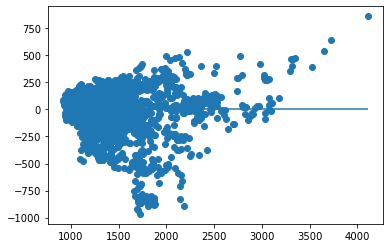

In [690]:
#Create Predictions from X_test set
predictions = model.predict(X_test_scaled)
# Plot Residuals
plt.scatter(predictions, predictions - y_test)
plt.hlines(y=0, xmin=predictions.min(), xmax=predictions.max())
plt.show()

In [691]:
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"mean squared error (MSE): {mse}")
print(f"R-squared (R2 ): {r2}")

mean squared error (MSE): 36245.917524917626
R-squared (R2 ): 0.8116933823777418


In [692]:
X2 = sma.add_constant(X_train_scaled)
est = sma.OLS(y_train, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.825
Model:                            OLS   Adj. R-squared:                  0.825
Method:                 Least Squares   F-statistic:                 1.298e+04
Date:                Sun, 14 Aug 2022   Prob (F-statistic):               0.00
Time:                        12:20:04   Log-Likelihood:                -36476.
No. Observations:                5525   AIC:                         7.296e+04
Df Residuals:                    5522   BIC:                         7.298e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1391.1613      2.399    580.009      0.0

In [636]:
cluster = ml_data_all[['Avg_Sale_Price', 'HVI', 'Avg_Rent', 'Size_1M-2.9M', 'Size_3M+', 'Size_Below_1M']]
cluster.head()

,Avg_Sale_Price,HVI,Avg_Rent,Size_1M-2.9M,Size_3M+,Size_Below_1M
0,365000.0,398201.0,2335.0,0,1,0
1,481333.0,516105.0,1846.0,0,1,0
2,183667.0,198819.0,1477.0,0,1,0
3,174967.0,166352.0,1130.0,0,1,0
4,210833.0,214635.0,1316.0,0,1,0


In [637]:
from sklearn.cluster import KMeans

In [638]:
X_scaled = StandardScaler().fit_transform(cluster)
X_scaled

array([[ 0.71327592,  0.77219124,  2.18446938, -0.81649658,  2.        ,
        -0.81649658],
       [ 1.61147894,  1.52756752,  1.04803003, -0.81649658,  2.        ,
        -0.81649658],
       [-0.68678982, -0.50519062,  0.1904715 , -0.81649658,  2.        ,
        -0.81649658],
       ...,
       [ 2.05128827,  2.01410559,  0.84584143, -0.81649658, -0.5       ,
         1.22474487],
       [ 1.24152118,  0.95619825,  0.63668082, -0.81649658, -0.5       ,
         1.22474487],
       [ 2.23173494,  1.94871875,  1.06894609, -0.81649658, -0.5       ,
         1.22474487]])

In [639]:
# Create an elbow curve to find the best value for K.
inertia = []
k = list(range(1, 11))

for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(X_scaled)
    inertia.append(km.inertia_)
    
# Define DataFrame and plot the Elbow Curve using hvPlot
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)
df_elbow.hvplot.line(x="k", y="inertia", title="Elbow Curve", xticks=k)

:Curve   [k]   (inertia)

In [640]:
# Initialize the K-Means model.
model = KMeans(n_clusters=4, random_state=1)

# Fit the model
model.fit(X_scaled)

# Predict clusters
predictions = model.predict(X_scaled)
predictions

array([2, 3, 2, ..., 3, 1, 3])

In [641]:
cluster['Class'] = model.labels_
cluster.head()

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Avg_Sale_Price,HVI,Avg_Rent,Size_1M-2.9M,Size_3M+,Size_Below_1M,Class
0,365000.0,398201.0,2335.0,0,1,0,2
1,481333.0,516105.0,1846.0,0,1,0,3
2,183667.0,198819.0,1477.0,0,1,0,2
3,174967.0,166352.0,1130.0,0,1,0,2
4,210833.0,214635.0,1316.0,0,1,0,2


In [642]:
cluster.hvplot.scatter(x='HVI', y='Avg_Rent', by='Class')

:NdOverlay   [Class]
   :Scatter   [HVI]   (Avg_Rent)

In [643]:
import plotly.express as px
fig = px.parallel_coordinates(cluster, color='Class', title='Class data, all fields')
fig.show()

In [644]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df2 = df.copy()
df2['Size'] = le.fit_transform(df2['Size'])
df2.head()

,Date,City,State,Size,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2014-02-28,New York,NY,1,365000.0,0.46,398201.0,0.43,2335.0,1.26
1,2014-02-28,Los Angeles-Long Beach-Anaheim,CA,1,481333.0,0.49,516105.0,0.48,1846.0,1.71
2,2014-02-28,Chicago,IL,1,183667.0,-2.48,198819.0,0.77,1477.0,0.89
3,2014-02-28,Dallas-Fort Worth,TX,1,174967.0,0.38,166352.0,0.65,1130.0,2.26
4,2014-02-28,Philadelphia,PA,1,210833.0,-2.69,214635.0,0.27,1316.0,-2.52


In [645]:
df2[['Avg_Sale_Price', 'HVI', 'Avg_Rent']] = MinMaxScaler().fit_transform(df2[['Avg_Sale_Price', 'HVI', 'Avg_Rent']])

In [646]:
fig = px.parallel_coordinates(df2, color='Size',
                 dimensions=['Avg_Sale_Price', 'HVI', 'Avg_Rent'])
fig.show()

In [647]:
cluster = df2[['Size','Avg_Sale_Price', 'HVI', 'Avg_Rent']] 
X_scaled = MinMaxScaler().fit_transform(cluster)

In [648]:
# Create an elbow curve to find the best value for K.
inertia = []
k = list(range(1, 11))

for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(X_scaled)
    inertia.append(km.inertia_)
    
# Define DataFrame and plot the Elbow Curve using hvPlot
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)
df_elbow.hvplot.line(x="k", y="inertia", title="Elbow Curve", xticks=k)

:Curve   [k]   (inertia)

In [649]:
# Initialize the K-Means model.
model = KMeans(n_clusters=3, random_state=1)

# Fit the model
model.fit(X_scaled)

# Predict clusters
predictions = model.predict(X_scaled)
predictions

array([2, 2, 2, ..., 0, 0, 0])

In [650]:
cluster['Class'] = model.labels_
cluster.head()

C:\Users\mario\anaconda3\envs\mlenv\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Size,Avg_Sale_Price,HVI,Avg_Rent,Class
0,1,0.241179,0.212196,0.631664,2
1,1,0.351916,0.296953,0.434168,2
2,1,0.068569,0.068867,0.285137,2
3,1,0.060287,0.045528,0.144992,2
4,1,0.094428,0.080237,0.220113,2


In [651]:
fig = px.parallel_coordinates(cluster, color='Class',
                 dimensions=['Size','Avg_Sale_Price', 'HVI', 'Avg_Rent'])
fig.show()

In [652]:
df2.head()

,Date,City,State,Size,Avg_Sale_Price,%Change_SP,HVI,%Change_HVI,Avg_Rent,%Change_Rent
0,2014-02-28,New York,NY,1,0.241179,0.46,0.212196,0.43,0.631664,1.26
1,2014-02-28,Los Angeles-Long Beach-Anaheim,CA,1,0.351916,0.49,0.296953,0.48,0.434168,1.71
2,2014-02-28,Chicago,IL,1,0.068569,-2.48,0.068867,0.77,0.285137,0.89
3,2014-02-28,Dallas-Fort Worth,TX,1,0.060287,0.38,0.045528,0.65,0.144992,2.26
4,2014-02-28,Philadelphia,PA,1,0.094428,-2.69,0.080237,0.27,0.220113,-2.52


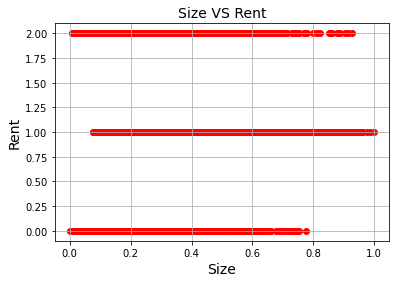

In [673]:
plt.scatter(df2['Avg_Rent'], df2['Size'], color='red')
plt.title('Size VS Rent', fontsize=14)
plt.xlabel('Size', fontsize=14)
plt.ylabel('Rent', fontsize=14)
plt.grid(True)
plt.show()

In [653]:
X = df2[['Size','Avg_Sale_Price', 'HVI']]
y= df2['Avg_Rent'].values.reshape(-1, 1)

In [654]:
# Creating a MinMaxScaler instance to scale data and try and fix multicollinearity
scaler = MinMaxScaler()
# Fitting the Standard Scaler with the training data.
X_scaler = scaler.fit(X_train)

# Scaling the data.
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [655]:
model = LinearRegression()
model.fit(X_train_scaled, y_train)
score = model.score(X_train_scaled, y_train)
print(f"R2 Score: {score}")

R2 Score: 0.8469221665656448


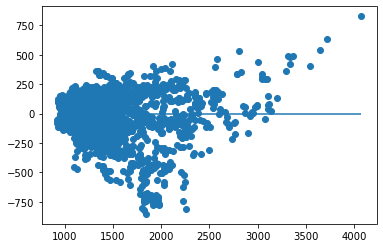

In [656]:
#Create Predictions from X_test set
predictions = model.predict(X_test_scaled)
# Plot Residuals
plt.scatter(predictions, predictions - y_test)
plt.hlines(y=0, xmin=predictions.min(), xmax=predictions.max())
plt.show()

In [657]:
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"mean squared error (MSE): {mse}")
print(f"R-squared (R2 ): {r2}")

mean squared error (MSE): 30409.953482403616
R-squared (R2 ): 0.8420126769205121


In [658]:
X2 = sma.add_constant(X_train_scaled)
est = sma.OLS(y_train, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.847
Model:                            OLS   Adj. R-squared:                  0.847
Method:                 Least Squares   F-statistic:                     7635.
Date:                Sun, 14 Aug 2022   Prob (F-statistic):               0.00
Time:                        12:04:08   Log-Likelihood:                -36101.
No. Observations:                5525   AIC:                         7.221e+04
Df Residuals:                    5520   BIC:                         7.224e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        728.3575      3.213    226.698      0.0

In [666]:
X = df2[['Avg_Sale_Price', 'HVI']]
y= df2['Avg_Rent'].values.reshape(-1, 1)

In [667]:
# Creating a StandardScaler instance to scale data and try and fix multicollinearity
scaler = StandardScaler()
# Fitting the Standard Scaler with the training data.
X_scaler = scaler.fit(X_train)

# Scaling the data.
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [668]:
model = LinearRegression()
model.fit(X_train_scaled, y_train)
score = model.score(X_train_scaled, y_train)
print(f"R2 Score: {score}")

R2 Score: 0.8469221665656448


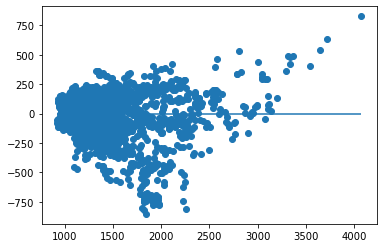

In [669]:
#Create Predictions from X_test set
predictions = model.predict(X_test_scaled)
# Plot Residuals
plt.scatter(predictions, predictions - y_test)
plt.hlines(y=0, xmin=predictions.min(), xmax=predictions.max())
plt.show()

In [670]:
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"mean squared error (MSE): {mse}")
print(f"R-squared (R2 ): {r2}")

mean squared error (MSE): 30409.953482403616
R-squared (R2 ): 0.8420126769205121


In [671]:
X2 = sma.add_constant(X_train_scaled)
est = sma.OLS(y_train, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.847
Model:                            OLS   Adj. R-squared:                  0.847
Method:                 Least Squares   F-statistic:                     7635.
Date:                Sun, 14 Aug 2022   Prob (F-statistic):               0.00
Time:                        12:08:05   Log-Likelihood:                -36101.
No. Observations:                5525   AIC:                         7.221e+04
Df Residuals:                    5520   BIC:                         7.224e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1391.1613      2.241    620.670      0.0